
# pyforest auto-imports - don't write above this line
# Keras Regression

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
# %matplotlib notebook
plt.rcParams["figure.figsize"] = (12,6)
# plt.rcParams['figure.dpi'] = 100
sns.set_style("whitegrid")
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

In [ ]:
!pip install folium 

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [ ]:
from matplotlib import style
style.use('dark_background')

In [ ]:
df = pd.read_csv("kc_house_data.csv")
df

## Exploratory Data Analysis and Visualization

In [ ]:
df.head()

We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower,75 or ¾ bath is a bathroom that contains one sink, one toilet and a shower or a bath. Traditionally, a full bath contains at least one sink, one toilet, a shower and a bath, so a . 75 bathroom only has either a shower or a bath.
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [ ]:
df.info()

In [9]:
df.isnull().sum().any()

False

In [ ]:
df.describe().T

### İd_number

In [ ]:
df = df.drop('id', axis = 1)

### price

In [ ]:
sns.distplot(df['price']);

In [ ]:
df[df["price"] > 4000000]

In [14]:
df.groupby("waterfront").mean().T
# deniz kenarı 3 kat fiyat farkı oluşturdu.

waterfront,0,1
price,531762.324,1662524.184
bedrooms,3.374,3.301
bathrooms,2.112,2.678
sqft_living,2072.007,3173.687
sqft_lot,15021.290,25371.828
floors,1.493,1.641
view,0.207,3.767
condition,3.409,3.534
grade,7.649,8.773
sqft_above,1783.392,2473.043


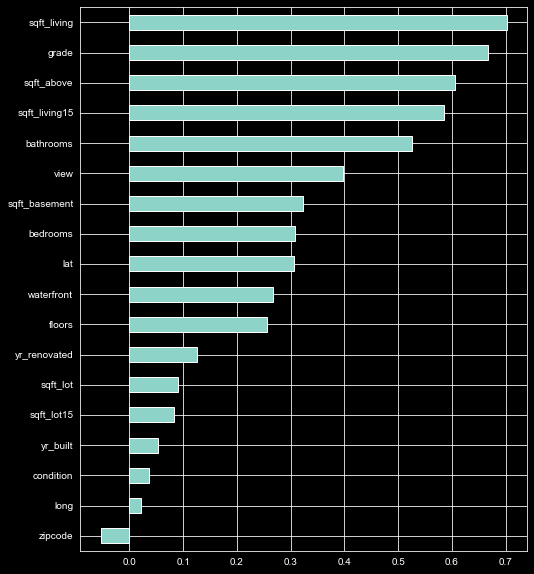

In [15]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");
# price ile corr. bakalım. ev büyüklüğü en büyük corr, score da önemli, banyo vs  

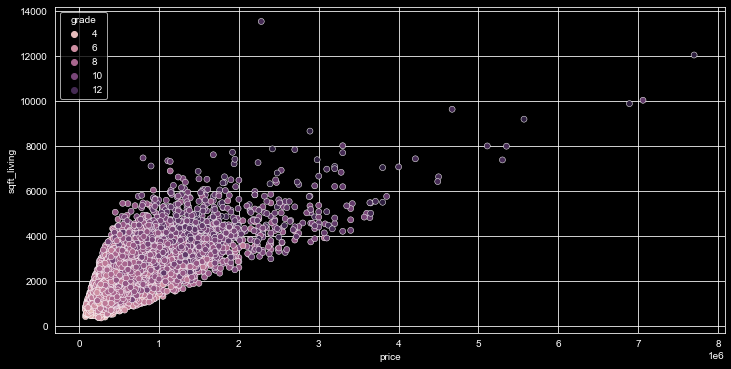

In [16]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");
# fiyatların yaşam alanı ile orantısı ve derece de hue de.

### bedrooms

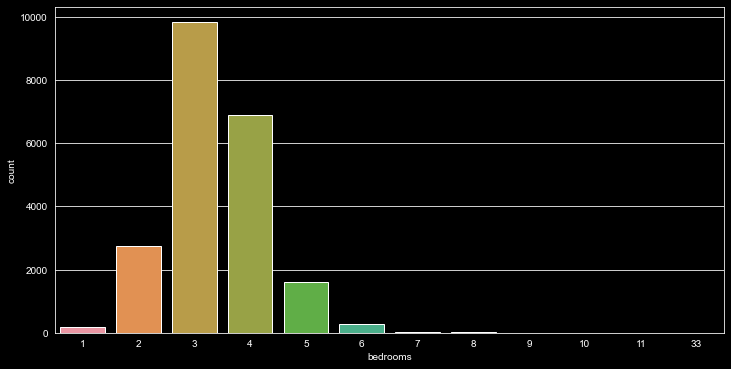

In [17]:
sns.countplot(df['bedrooms']);
# 33 ayrı duruyor.

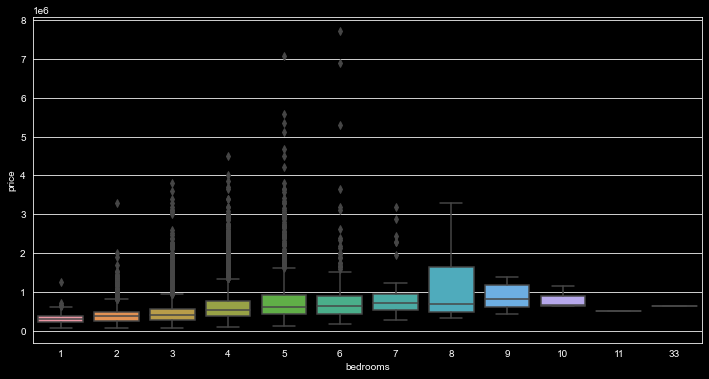

In [18]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);
## 33 odalı evin fiyatı düşük garip geldi.

In [19]:
df[df["bedrooms"] > 10]
# 0 dan büyüklere bakalım, banyo 1. 75 yaşam alanı da uyumlu değil, 3 ü yanlış girdiler atalım o halde.

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [20]:
df = df[df["bedrooms"] != 33] # 33 atıldı.

Most likely the data was entered incorrectly.

In [21]:
df.shape #  satır azaldı.

(21596, 20)

### date

In [22]:
df['date'].dtype
# date obj. olarka modele girmez, time serisi değilse imsforment,
# did. çalışmaz bölüp parçalaşyacağız.

dtype('O')

In [23]:
df['date'] = pd.to_datetime(df['date'])
# date time çevirdik.

In [24]:
df['date']
# baktık dtype dönüştü.

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [25]:
df['year'] = df['date'].apply(lambda date : date.year)
# yılı ve ayı içinden çektik

In [26]:
df['month'] = df['date'].apply(lambda date : date.month)
# yılı ve ayı içinden çektik

In [27]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


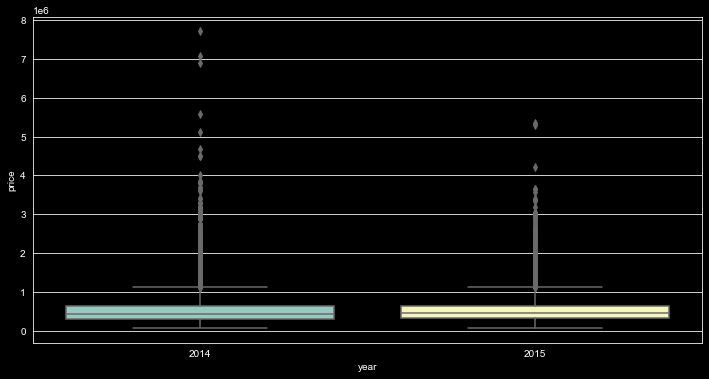

In [28]:
sns.boxplot(x = 'year', y = 'price', data = df);
# yılın price etkisi 

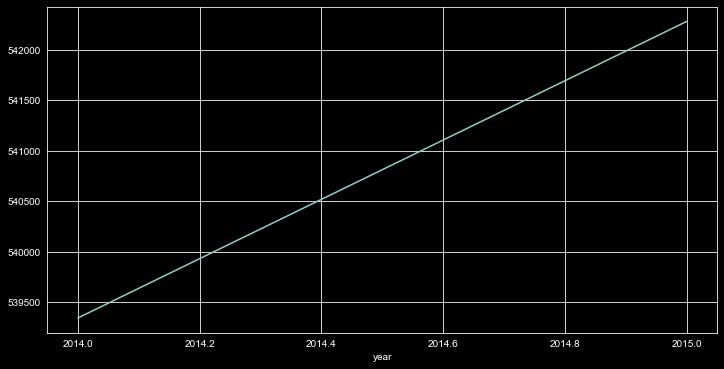

In [29]:
df.groupby('year')['price'].mean().plot();
# ort . fiyatlara bakalım etki çok yok gibi, yıl önemli değil.

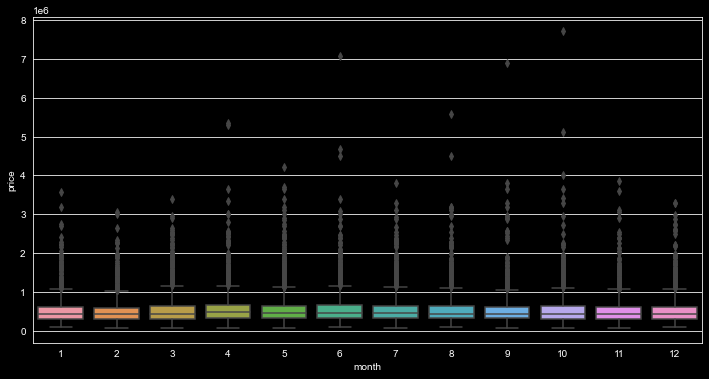

In [30]:
sns.boxplot(x = 'month', y = 'price', data = df);
# her aya bakalım çok da anlamlı değil.

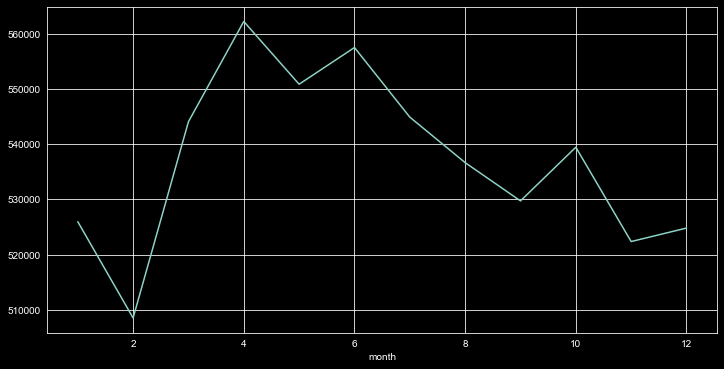

In [31]:
df.groupby('month')['price'].mean().plot();
# fiyat ort. göre bakalım az fark var, bahar aylarında artmış ama. sezonlsal bir durum.

In [32]:
month_dummy = pd.get_dummies(df["month"], prefix = "month")
df = pd.concat([df, month_dummy], axis = 1)
df.head()
# month ağırlıklanmasın dedik. dummy yaptık

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [33]:
df = df.drop(['date', "year", "month"], axis = 1)
# month dummy yetere diğerlerini at.

### zipcode

In [34]:
df['zipcode'].value_counts()

98103    601
98038    589
98115    583
98052    574
98117    553
98042    547
98034    545
98118    507
98023    499
98006    498
98133    493
98059    468
98058    455
98155    446
98074    441
98033    432
98027    412
98125    409
98056    406
98053    403
98001    361
98075    359
98126    354
98092    351
98144    343
98106    335
98116    330
98029    321
98004    317
98199    317
98065    308
98122    290
98146    288
98008    283
98028    283
98040    282
98198    280
98003    280
98031    273
98072    273
98168    269
98112    269
98055    268
98107    266
98136    263
98178    262
98030    256
98177    255
98166    254
98022    233
98105    229
98045    220
98002    199
98077    198
98011    195
98019    190
98108    186
98119    184
98005    168
98007    141
98188    136
98032    125
98014    124
98070    117
98109    109
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [35]:
df = df.drop('zipcode', axis = 1)
# dummy de 70 sutun çıkar, mahallede önemli ama, şehir ortası batısı denebilir.
# koordinat bilgiside var onun için bunları da attık

### yr_renovated & yr_built

In [36]:
df['yr_renovated'].value_counts()
# yıl bilgisi 2 tane yenileme tarihi de var. 0 lar yenileme yok diğerlerinde tarih var.
# scale edince 0 en az katkı yapacak kalabilir.

0       20682
2014       91
2013       37
2003       36
2005       35
2007       35
2000       35
2004       26
1990       25
2006       24
2002       22
2009       22
1989       22
1991       20
1998       19
2001       19
1994       19
1993       19
1987       18
2010       18
2008       18
1983       18
1984       18
1985       17
1999       17
1992       17
1986       17
2015       16
1995       16
1988       15
1996       15
1997       15
2011       13
2012       11
1980       11
1982       11
1979       10
1970        9
1977        8
1968        8
1978        6
1975        6
1973        5
1965        5
1981        5
1964        5
1958        5
1960        4
1972        4
1963        4
1969        4
1976        3
1974        3
1953        3
1955        3
1956        3
1945        3
1957        3
1950        2
1962        2
1940        2
1946        2
1971        2
1967        2
1934        1
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, 

In [37]:
df['yr_built'].value_counts()
# hepsinde yapılma tarihi var.

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

could make sense due to scaling, higher should correlate to more value

In [38]:
#df["yr_renovated"].replace(0, np.nan, inplace = True)                # 0 lara nan atadık
#df["yr_renovated"].fillna(df["yr_built"], inplace = True)            # nan ları yapım tarihine göre doldurduk
#df.drop("yr_built", axis = 1, inplace = True)                        # yapım yılını düştük.

In [39]:
 df["yr_renovated"].replace(0, np.nan, inplace = True)               #0 lara nan atadık
 df["yr_renovated"].fillna(df["yr_built"], inplace = True)           # nan ları yapım tarihine göre doldurduk
 df["new_age"] = 2021 - df["yr_renovated"]                           # yaşlarını hesaplayıp bulduk
 df.drop(["yr_renovated", "yr_built"], axis = 1, inplace = True)     # yeni yaş yeter diğerlerini düştük

### sqft_basement

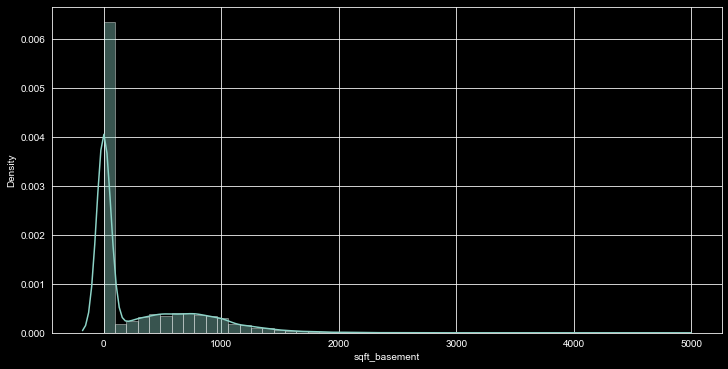

In [40]:
sns.distplot(df['sqft_basement']);
# yuksek değ. bakalım, bodrum katı olmayanlar 0 da, 13000 tane.

In [41]:
df['sqft_basement'].value_counts()

0      13110
600      221
700      218
500      214
800      206
       ...  
518        1
374        1
784        1
906        1
248        1
Name: sqft_basement, Length: 306, dtype: int64

In [42]:
df[df["sqft_basement"] > 3000]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,new_age
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0,34.000
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0,12.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0,41.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0,22.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0,30.000


could make sense due to scaling, higher should correlate to more value

### sqft_above

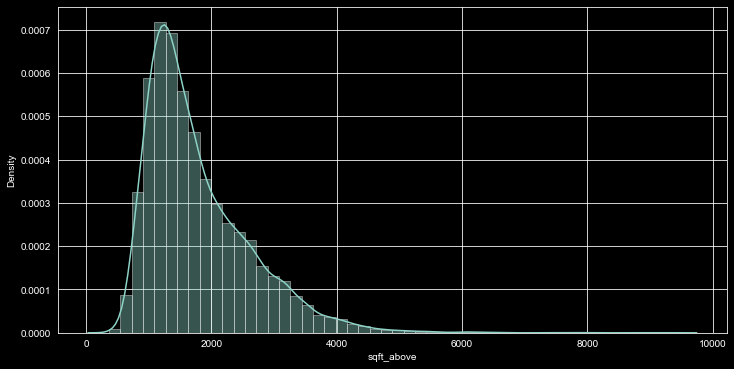

In [43]:
sns.distplot(df['sqft_above']);

In [44]:
df['sqft_above'].value_counts()

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
3674      1
2979      1
2382      1
6290      1
1425      1
Name: sqft_above, Length: 942, dtype: int64

In [45]:
df[df["sqft_above"] > 6000]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,new_age
419,1550000.000,5,4.250,6070,171626,2.000,0,0,3,12,6070,0,47.595,-121.950,4680,211267,0,0,0,0,0,0,1,0,0,0,0,0,22.000
527,1600000.000,6,5.000,6050,230652,2.000,0,3,3,11,6050,0,47.603,-121.943,4210,233971,0,0,0,0,0,1,0,0,0,0,0,0,20.000
1099,1570000.000,5,4.500,6070,14731,2.000,0,0,3,11,6070,0,47.531,-122.134,4750,13404,0,0,0,0,0,0,0,0,0,0,1,0,17.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0,12.000
2624,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,47.749,-122.280,3030,23408,0,0,0,0,0,0,0,1,0,0,0,0,17.000
3118,1320000.000,4,5.250,6110,10369,2.000,0,0,3,11,6110,0,47.529,-122.135,4190,10762,0,0,0,0,0,0,0,0,0,0,1,0,16.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0,20.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0,20.000
4807,2480000.000,5,3.750,6810,7500,2.500,0,0,3,13,6110,700,47.629,-122.322,2660,7500,0,0,1,0,0,0,0,0,0,0,0,0,99.000
6495,1940000.000,4,5.750,7220,223462,2.000,0,4,3,12,6220,1000,47.710,-122.013,2680,7593,0,1,0,0,0,0,0,0,0,0,0,0,21.000


### Geographical Properties

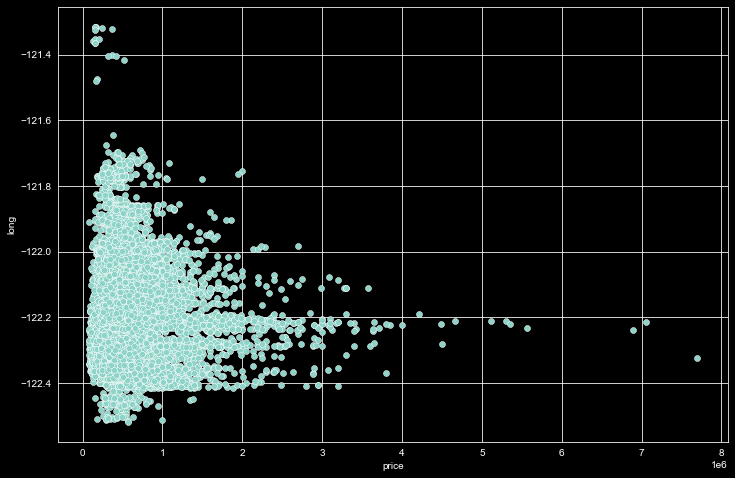

In [46]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

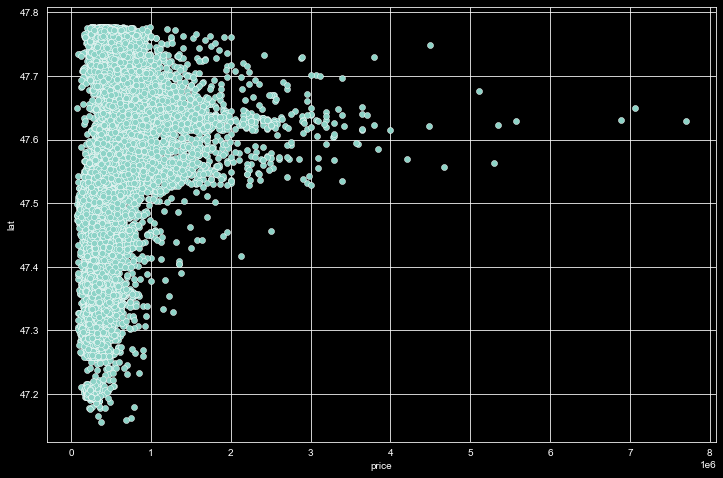

In [47]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);
# 47 civarı fiyatlar arttı.

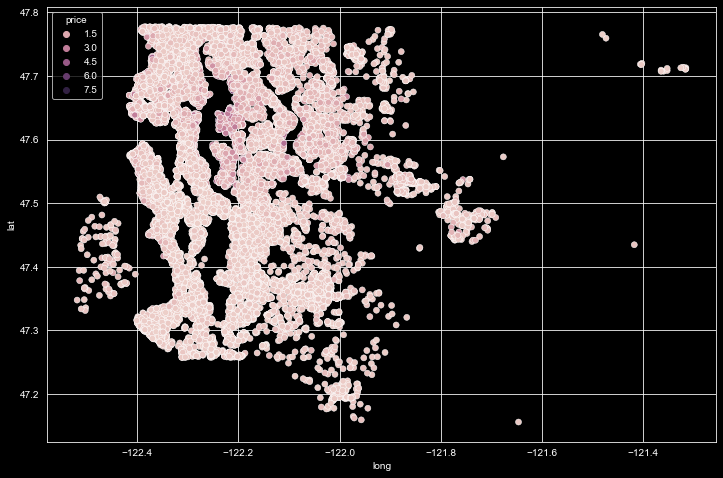

In [48]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');
# enlem boylam fiyat dengesine bakalım.

In [49]:
len(df) * (0.01)# tüzde biri kaç satır.

215.96

In [50]:
df.sort_values('price', ascending = False).head(216) # yuzde birini çıkardık geçici oalrak iyi görsel için.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,new_age
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0,34.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0,20.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0,20.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0,20.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0,12.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0,14.000
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0,31.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0,14.000
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0,70.000


In [51]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:] # 216 gerisini aldım.

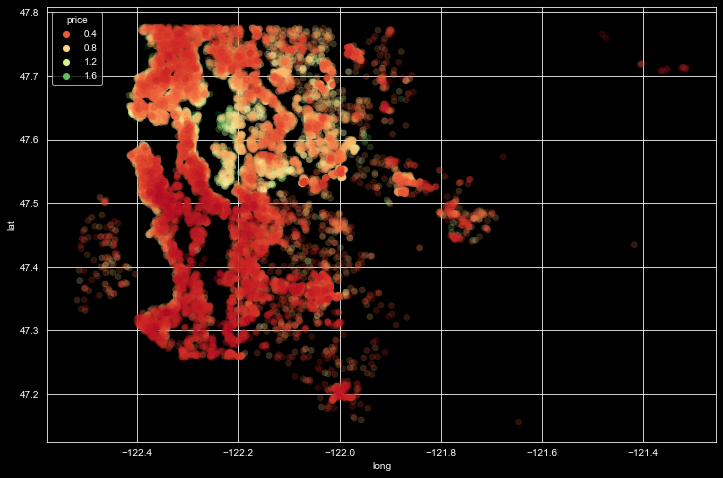

In [52]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);
# yeşiller fiyatı yuksek olanalr, kırmızı düşük, arada göl gibi birşeyler var harita sundu.

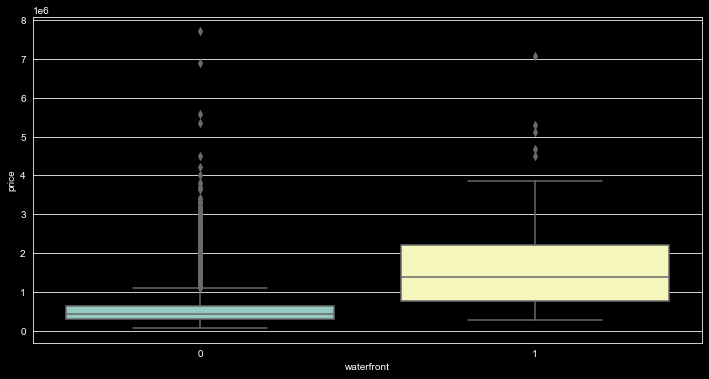

In [53]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);# deniz kenarı uçtu

In [54]:
import folium
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)
# follium dünya haritasını import ettik , enlem ve boylamı location olarak koyduk.

In [55]:
map_kc = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10) # location=[47.511,  -122.257] .
for lat, lng in zip(df['lat'], df['long']):                                          # biliyorsak yazabiliriz.
    folium.CircleMarker(
        [lat, lng],
        radius = 1,
        color = 'blue',
        fill = False ,
        fill_color ='#3186CC',
        fill_opacity = 0.3).add_to(map_kc)
map_kc

Arkadaslar bir adresten pandas ile nasil koordinat cikarilacagini anlatan makale, faydali olacagi kanaatindeyim
https://towardsdatascience.com/how-to-generate-lat-and-long-coordinates-from-an-address-column-using-pandas-and-googlemaps-api-d66b2720248d

### latest data

In [56]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,new_age
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0,66.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1,30.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0,88.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1,56.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0,34.000


In [57]:
df.shape

(21596, 29)

## Preprocessing of Data
- Train | Test Split, Scalling

In [58]:
from sklearn.model_selection import train_test_split

In [59]:
X = df.drop('price', axis = 1)
y = df['price']

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)

In [61]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [62]:
scaler = MinMaxScaler()

In [63]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [64]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation # act. dense içine yazmak yerine add. diyerek erkledik

In [65]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score
# per. ölçecek metrikleri yazdık

In [66]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [67]:
X_train.shape

(19436, 28)

In [117]:
input_dim = X_train.shape[1]
input_dim

28

In [68]:
model = Sequential()
model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss = 'mse') # linear reg. problemi old.için mse yaptık.
# 19 kalabilir.feature sayısı kadar olsa iyi
# input dim yazınca giriş feature larını bildirdik aksi halde fit edince kendi öğrenecek, sonra weight ye bakacağız.

In [69]:
model.weights
# ilk random ağırlıklar bunlar, get dummy den önce 19 sutun vardı noronları oyle seçtim ama ne girersek o.
# faeture sayısına göre orantılı olsa iyi yani 29 29  gibi

[<tf.Variable 'dense/kernel:0' shape=(28, 19) dtype=float32, numpy=
 array([[ 0.09764796,  0.05722162, -0.2266647 , -0.17231435, -0.26611227,
         -0.04099196,  0.01788807, -0.07548961,  0.07033563,  0.12707588,
         -0.04337734, -0.35077843, -0.32239217,  0.16876894, -0.30310613,
          0.26713502, -0.27872425, -0.02776662, -0.20851189],
        [-0.23680514, -0.29663634,  0.27126616,  0.33798158, -0.10123906,
         -0.21347149, -0.03449929, -0.19860445,  0.13540083,  0.33121765,
         -0.33283398,  0.32066125, -0.3241986 ,  0.3057313 , -0.1307162 ,
          0.18712527, -0.06221938, -0.26896182, -0.33359852],
        [ 0.11334479,  0.05306047,  0.00871184, -0.19831873,  0.0608542 ,
          0.2577566 , -0.02953586, -0.24223718, -0.06160104, -0.2810763 ,
          0.23243272,  0.20998389, -0.1553342 ,  0.27046806,  0.14655983,
         -0.3546199 , -0.18281911, -0.1564267 ,  0.19581848],
        [ 0.22917157, -0.2863696 ,  0.16253054,  0.3352651 , -0.21955222,
      

In [70]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)
# 200 300 denedim öğrenmeye devam edince 1000 yaptık deneme yanılmayla. 
#  validation_split = 0.15 değeri de sondaki yuzde 15 i ayırdı. çıkmış halini kullandı. suffle default değeri.
# yuzde 15 i ayır modeli çalıştır. 128 lik satırlar halinde modele ver.

""""validation_split: datanın sondaki yüzde 15 lik kısmını validate yapmak için ayırdı.
eğitim için datamın geri kalanını kullanacak.
her epochs'ta aynı son %15 lik bölümü ayırıyor. kalan kısmı karıştırıyor öyle modele sokuyor.

hocam yani tüm datanın yüzde 15 ini alıyoruz onuda batchsize=128 şeklinde veriyoruz
"""""
# 130. batch te  loss, her epoch ta va_los alınır.scorları gösterir. 
# her batch te tarin den scor her epoch ta validate den score alır.
# suffle  her epoch başında yapılır.

Epoch 1/1000
130/130 [==============================] - 1s 2ms/step - loss: 428597870592.0000 - val_loss: 423895859200.0000
Epoch 2/1000
130/130 [==============================] - 0s 1ms/step - loss: 426223632384.0000 - val_loss: 415250186240.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 389365727232.0000 - val_loss: 333208715264.0000
Epoch 4/1000
130/130 [==============================] - 0s 1ms/step - loss: 242153930752.0000 - val_loss: 150218489856.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 110292312064.0000 - val_loss: 105785155584.0000
Epoch 6/1000
130/130 [==============================] - 0s 1ms/step - loss: 97051344896.0000 - val_loss: 103692271616.0000
Epoch 7/1000
130/130 [==============================] - 0s 1ms/step - loss: 94883897344.0000 - val_loss: 101635940352.0000
Epoch 8/1000
130/130 [==============================] - 0s 1ms/step - loss: 92756910080.0000 - val_loss: 99574767616.0000
Epoch 9/1000

130/130 [==============================] - 0s 2ms/step - loss: 37298511872.0000 - val_loss: 41983016960.0000
Epoch 68/1000
130/130 [==============================] - 0s 1ms/step - loss: 37063532544.0000 - val_loss: 41578373120.0000
Epoch 69/1000
130/130 [==============================] - 0s 2ms/step - loss: 36915159040.0000 - val_loss: 41280839680.0000
Epoch 70/1000
130/130 [==============================] - 0s 2ms/step - loss: 36764999680.0000 - val_loss: 41181978624.0000
Epoch 71/1000
130/130 [==============================] - 0s 1ms/step - loss: 36587642880.0000 - val_loss: 40873574400.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 36436496384.0000 - val_loss: 40714031104.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 36311506944.0000 - val_loss: 40650698752.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 36167503872.0000 - val_loss: 40348758016.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 32531165184.0000 - val_loss: 36119166976.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 32529362944.0000 - val_loss: 35888619520.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 32507625472.0000 - val_loss: 35547746304.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 32442451968.0000 - val_loss: 35464622080.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 32414373888.0000 - val_loss: 35411755008.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 32362375168.0000 - val_loss: 35702382592.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 32402057216.0000 - val_loss: 35494776832.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 32301780992.0000 - val_loss: 35365564416.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 30697697280.0000 - val_loss: 33164412928.0000
Epoch 200/1000
130/130 [==============================] - 0s 1ms/step - loss: 30671083520.0000 - val_loss: 33069117440.0000
Epoch 201/1000
130/130 [==============================] - 0s 2ms/step - loss: 30676981760.0000 - val_loss: 33085779968.0000
Epoch 202/1000
130/130 [==============================] - 0s 1ms/step - loss: 30627997696.0000 - val_loss: 33334878208.0000
Epoch 203/1000
130/130 [==============================] - 0s 1ms/step - loss: 30595889152.0000 - val_loss: 33388349440.0000
Epoch 204/1000
130/130 [==============================] - 0s 1ms/step - loss: 30580013056.0000 - val_loss: 33280153600.0000
Epoch 205/1000
130/130 [==============================] - ETA: 0s - loss: 30599262208.000 - 0s 2ms/step - loss: 30563276800.0000 - val_loss: 33085360128.0000
Epoch 206/1000
130/130 [==============================] - 0s 2ms/step - loss: 30506745856.0000 - val_loss: 329612

Epoch 265/1000
130/130 [==============================] - 0s 1ms/step - loss: 29377114112.0000 - val_loss: 31953205248.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 29400698880.0000 - val_loss: 31741179904.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 29333671936.0000 - val_loss: 31956172800.0000
Epoch 268/1000
130/130 [==============================] - 0s 1ms/step - loss: 29364836352.0000 - val_loss: 31676321792.0000
Epoch 269/1000
130/130 [==============================] - 0s 1ms/step - loss: 29314680832.0000 - val_loss: 31775551488.0000
Epoch 270/1000
130/130 [==============================] - 0s 1ms/step - loss: 29279057920.0000 - val_loss: 31936626688.0000
Epoch 271/1000
130/130 [==============================] - 0s 1ms/step - loss: 29296173056.0000 - val_loss: 31806177280.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 29267400704.0000 - val_loss: 31571906560.0000
Epoch 27

Epoch 331/1000
130/130 [==============================] - 0s 1ms/step - loss: 28500049920.0000 - val_loss: 30978576384.0000
Epoch 332/1000
130/130 [==============================] - 0s 2ms/step - loss: 28483723264.0000 - val_loss: 31030571008.0000
Epoch 333/1000
130/130 [==============================] - 0s 2ms/step - loss: 28456884224.0000 - val_loss: 31084482560.0000
Epoch 334/1000
130/130 [==============================] - 0s 1ms/step - loss: 28507049984.0000 - val_loss: 31012540416.0000
Epoch 335/1000
130/130 [==============================] - 0s 1ms/step - loss: 28474114048.0000 - val_loss: 31010684928.0000
Epoch 336/1000
130/130 [==============================] - 0s 1ms/step - loss: 28493260800.0000 - val_loss: 31011874816.0000
Epoch 337/1000
130/130 [==============================] - 0s 1ms/step - loss: 28446965760.0000 - val_loss: 30856818688.0000
Epoch 338/1000
130/130 [==============================] - 0s 1ms/step - loss: 28434034688.0000 - val_loss: 30990837760.0000
Epoch 33

130/130 [==============================] - 0s 2ms/step - loss: 27918471168.0000 - val_loss: 30637733888.0000
Epoch 398/1000
130/130 [==============================] - 0s 1ms/step - loss: 27931899904.0000 - val_loss: 30590167040.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 27909050368.0000 - val_loss: 30526963712.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 27931381760.0000 - val_loss: 30591051776.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 27879710720.0000 - val_loss: 31031494656.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 27880585216.0000 - val_loss: 30505363456.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 27882262528.0000 - val_loss: 30580092928.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 27913926656.0000 - val_loss: 30700883968.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27651026944.0000 - val_loss: 30624577536.0000
Epoch 464/1000
130/130 [==============================] - 0s 2ms/step - loss: 27615737856.0000 - val_loss: 30348734464.0000
Epoch 465/1000
130/130 [==============================] - 0s 2ms/step - loss: 27590674432.0000 - val_loss: 30413905920.0000
Epoch 466/1000
130/130 [==============================] - 0s 2ms/step - loss: 27607169024.0000 - val_loss: 30530062336.0000
Epoch 467/1000
130/130 [==============================] - 0s 2ms/step - loss: 27576913920.0000 - val_loss: 30647687168.0000
Epoch 468/1000
130/130 [==============================] - 0s 2ms/step - loss: 27599839232.0000 - val_loss: 30436521984.0000
Epoch 469/1000
130/130 [==============================] - 0s 2ms/step - loss: 27559741440.0000 - val_loss: 30772475904.0000
Epoch 470/1000
130/130 [==============================] - 0s 2ms/step - loss: 27637762048.0000 - val_loss: 30783475712.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 27281891328.0000 - val_loss: 30711332864.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 27311425536.0000 - val_loss: 30239145984.0000
Epoch 531/1000
130/130 [==============================] - 0s 2ms/step - loss: 27283644416.0000 - val_loss: 30400514048.0000
Epoch 532/1000
130/130 [==============================] - 0s 1ms/step - loss: 27291873280.0000 - val_loss: 30434519040.0000
Epoch 533/1000
130/130 [==============================] - 0s 2ms/step - loss: 27262906368.0000 - val_loss: 30196295680.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 27267866624.0000 - val_loss: 30310727680.0000
Epoch 535/1000
130/130 [==============================] - 0s 1ms/step - loss: 27256240128.0000 - val_loss: 30424313856.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 27244998656.0000 - val_loss: 30314512384.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 26952048640.0000 - val_loss: 30247606272.0000
Epoch 596/1000
130/130 [==============================] - 0s 1ms/step - loss: 26934380544.0000 - val_loss: 30358493184.0000
Epoch 597/1000
130/130 [==============================] - 0s 1ms/step - loss: 26957107200.0000 - val_loss: 30165485568.0000
Epoch 598/1000
130/130 [==============================] - 0s 2ms/step - loss: 27108483072.0000 - val_loss: 30333839360.0000
Epoch 599/1000
130/130 [==============================] - 0s 1ms/step - loss: 26939607040.0000 - val_loss: 30390329344.0000
Epoch 600/1000
130/130 [==============================] - 0s 2ms/step - loss: 26937696256.0000 - val_loss: 30464966656.0000
Epoch 601/1000
130/130 [==============================] - 0s 1ms/step - loss: 26905470976.0000 - val_loss: 30403856384.0000
Epoch 602/1000
130/130 [==============================] - 0s 1ms/step - loss: 26881349632.0000 - val_loss: 30507235328.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 26682497024.0000 - val_loss: 30191333376.0000
Epoch 662/1000
130/130 [==============================] - 0s 1ms/step - loss: 26689234944.0000 - val_loss: 30379081728.0000
Epoch 663/1000
130/130 [==============================] - 0s 1ms/step - loss: 26706817024.0000 - val_loss: 30246703104.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 26691106816.0000 - val_loss: 30105696256.0000
Epoch 665/1000
130/130 [==============================] - 0s 1ms/step - loss: 26706864128.0000 - val_loss: 30262792192.0000
Epoch 666/1000
130/130 [==============================] - 0s 1ms/step - loss: 26677747712.0000 - val_loss: 30255691776.0000
Epoch 667/1000
130/130 [==============================] - 0s 1ms/step - loss: 26684106752.0000 - val_loss: 30448187392.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 26719571968.0000 - val_loss: 30044076032.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26613624832.0000 - val_loss: 30143836160.0000
Epoch 728/1000
130/130 [==============================] - 0s 1ms/step - loss: 26588866560.0000 - val_loss: 30597492736.0000
Epoch 729/1000
130/130 [==============================] - 0s 2ms/step - loss: 26531780608.0000 - val_loss: 30338224128.0000
Epoch 730/1000
130/130 [==============================] - 0s 1ms/step - loss: 26518734848.0000 - val_loss: 30255050752.0000
Epoch 731/1000
130/130 [==============================] - 0s 2ms/step - loss: 26501349376.0000 - val_loss: 30432065536.0000
Epoch 732/1000
130/130 [==============================] - 0s 1ms/step - loss: 26522863616.0000 - val_loss: 30217189376.0000
Epoch 733/1000
130/130 [==============================] - 0s 2ms/step - loss: 26503354368.0000 - val_loss: 30738515968.0000
Epoch 734/1000
130/130 [==============================] - 0s 1ms/step - loss: 26553305088.0000 - val_loss: 30219583488.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26422667264.0000 - val_loss: 30563620864.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 26400096256.0000 - val_loss: 30506436608.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 26446444544.0000 - val_loss: 30325387264.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 26393176064.0000 - val_loss: 30464714752.0000
Epoch 797/1000
130/130 [==============================] - 0s 1ms/step - loss: 26369443840.0000 - val_loss: 30414397440.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 26399596544.0000 - val_loss: 30398881792.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 26401935360.0000 - val_loss: 30380226560.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 26385899520.0000 - val_loss: 30266505216.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 26258579456.0000 - val_loss: 30559238144.0000
Epoch 860/1000
130/130 [==============================] - 0s 1ms/step - loss: 26263875584.0000 - val_loss: 30384691200.0000
Epoch 861/1000
130/130 [==============================] - 0s 2ms/step - loss: 26226020352.0000 - val_loss: 30422439936.0000
Epoch 862/1000
130/130 [==============================] - 0s 2ms/step - loss: 26294183936.0000 - val_loss: 30628706304.0000
Epoch 863/1000
130/130 [==============================] - 0s 2ms/step - loss: 26266441728.0000 - val_loss: 30561382400.0000
Epoch 864/1000
130/130 [==============================] - 0s 2ms/step - loss: 26244335616.0000 - val_loss: 30406762496.0000
Epoch 865/1000
130/130 [==============================] - 0s 2ms/step - loss: 26245453824.0000 - val_loss: 30589997056.0000
Epoch 866/1000
130/130 [==============================] - 0s 2ms/step - loss: 26245885952.0000 - val_loss: 30422032384.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26145943552.0000 - val_loss: 30528172032.0000
Epoch 926/1000
130/130 [==============================] - 0s 2ms/step - loss: 26154375168.0000 - val_loss: 30589878272.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 26146236416.0000 - val_loss: 30677446656.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 26159898624.0000 - val_loss: 31263000576.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 26190903296.0000 - val_loss: 30754834432.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 26147995648.0000 - val_loss: 30574942208.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 26144759808.0000 - val_loss: 30539665408.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 26154866688.0000 - val_loss: 30723063808.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26048364544.0000 - val_loss: 30938281984.0000
Epoch 992/1000
130/130 [==============================] - 0s 1ms/step - loss: 26025996288.0000 - val_loss: 30671095808.0000
Epoch 993/1000
130/130 [==============================] - 0s 2ms/step - loss: 26075469824.0000 - val_loss: 30845538304.0000
Epoch 994/1000
130/130 [==============================] - 0s 2ms/step - loss: 26074273792.0000 - val_loss: 30716090368.0000
Epoch 995/1000
130/130 [==============================] - 0s 2ms/step - loss: 26115997696.0000 - val_loss: 30729015296.0000
Epoch 996/1000
130/130 [==============================] - 0s 2ms/step - loss: 26036520960.0000 - val_loss: 30716381184.0000
Epoch 997/1000
130/130 [==============================] - 0s 3ms/step - loss: 26039181312.0000 - val_loss: 31065821184.0000
Epoch 998/1000
130/130 [==============================] - 0s 3ms/step - loss: 26062071808.0000 - val_loss: 30816724992.0000
Epoch 999/1000
130/130 

'"validation_split: datanın sondaki yüzde 15 lik kısmını validate yapmak için ayırdı.\neğitim için datamın geri kalanını kullanacak.\nher epochs\'ta aynı son %15 lik bölümü ayırıyor. kalan kısmı karıştırıyor öyle modele sokuyor.\n\nhocam yani tüm datanın yüzde 15 ini alıyoruz onuda batchsize=128 şeklinde veriyoruz\n'

130000 kere  1711 pametre değişti.

In [71]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 19)                551       
_________________________________________________________________
dense_1 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_2 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_3 (Dense)              (None, 19)                380       
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 20        
Total params: 1,711
Trainable params: 1,711
Non-trainable params: 0
_________________________________________________________________


In [72]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(28, 19) dtype=float32, numpy=
 array([[ 4.77450341e-01,  5.72216213e-02, -3.89951378e-01,
         -4.56339300e-01, -1.00803638e+00, -1.90987021e-01,
         -1.10554591e-01, -1.99830607e-01, -8.12784657e-02,
         -1.79494485e-01,  5.47480941e-01, -7.40977705e-01,
          1.09697312e-01, -7.96481669e-01, -6.83461368e-01,
          1.27205059e-01, -4.49625432e-01,  7.46787012e-01,
         -2.93160826e-01],
        [ 1.65546465e+00, -2.96636343e-01,  6.68118596e-01,
          7.13223994e-01,  3.50866914e-01,  2.04116926e-01,
          3.89008075e-01,  1.90828705e+00,  5.62515080e-01,
          1.22701895e+00,  8.79769564e-01,  6.23461843e-01,
          3.77913654e-01,  5.84400952e-01,  1.31856430e+00,
          5.99676967e-01,  3.55891496e-01, -1.99964270e-01,
         -4.11987960e-01],
        [ 1.31993759e+00,  5.30604720e-02,  1.60563910e+00,
          1.40541542e+00,  1.50199819e+00,  1.88279569e+00,
          1.59516549e+00,  2.53569102e

In [73]:
pd.DataFrame(model.history.history)
# ilk derste sadece loss vardı hist.hist. ikisinide verdi.

,loss,val_loss
0,428597870592.000,423895859200.000
1,426223632384.000,415250186240.000
2,389365727232.000,333208715264.000
3,242153930752.000,150218489856.000
4,110292312064.000,105785155584.000
...,...,...
995,26036520960.000,30716381184.000
996,26039181312.000,31065821184.000
997,26062071808.000,30816724992.000
998,26049994752.000,30717710336.000


<AxesSubplot:>

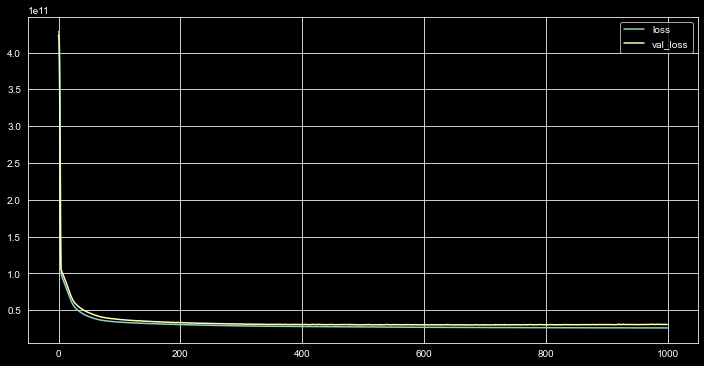

In [74]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()
# 

In [75]:
model.evaluate(X_test, y_test, verbose=0)

23689551872.0

In [76]:
y_pred = model.predict(X_test)

In [77]:
eval_metric(y_test, y_pred)

r2_score: 0.8156164654102043 
mae: 96692.13792679398 
mse: 23689552629.22633 
rmse: 153914.1079603372


### learning_rate

In [78]:
from tensorflow.keras.optimizers import Adam

In [79]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)   # default 0.001 di hızlı öğrensin dedik, arttırdık.
model.compile(optimizer = opt, loss = 'mse')

In [80]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 427551653888.0000 - val_loss: 415539232768.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 292833755136.0000 - val_loss: 110945976320.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 96678903808.0000 - val_loss: 101385027584.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 90758995968.0000 - val_loss: 95899926528.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 85146664960.0000 - val_loss: 89750773760.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 78279311360.0000 - val_loss: 82113642496.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 71060414464.0000 - val_loss: 74742292480.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 64217415680.0000 - val_loss: 68081262592.0000
Epoch 9/1000
130/13

130/130 [==============================] - 0s 3ms/step - loss: 32064991232.0000 - val_loss: 34472079360.0000
Epoch 68/1000
130/130 [==============================] - 0s 3ms/step - loss: 32080138240.0000 - val_loss: 34856464384.0000
Epoch 69/1000
130/130 [==============================] - 0s 3ms/step - loss: 32063799296.0000 - val_loss: 34420506624.0000
Epoch 70/1000
130/130 [==============================] - 0s 2ms/step - loss: 31825356800.0000 - val_loss: 34415140864.0000
Epoch 71/1000
130/130 [==============================] - 0s 3ms/step - loss: 31805931520.0000 - val_loss: 34352666624.0000
Epoch 72/1000
130/130 [==============================] - 0s 3ms/step - loss: 31809472512.0000 - val_loss: 34339876864.0000
Epoch 73/1000
130/130 [==============================] - 0s 3ms/step - loss: 31742593024.0000 - val_loss: 34278946816.0000
Epoch 74/1000
130/130 [==============================] - 0s 3ms/step - loss: 31667302400.0000 - val_loss: 34474946560.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 26875942912.0000 - val_loss: 28805361664.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 26665428992.0000 - val_loss: 28600375296.0000
Epoch 135/1000
130/130 [==============================] - 0s 1ms/step - loss: 26371512320.0000 - val_loss: 28819851264.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 26287284224.0000 - val_loss: 28206450688.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 26023614464.0000 - val_loss: 28724582400.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 25793652736.0000 - val_loss: 28201535488.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 25568751616.0000 - val_loss: 27740309504.0000
Epoch 140/1000
130/130 [==============================] - 0s 1ms/step - loss: 25278662656.0000 - val_loss: 28305580032.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 18940553216.0000 - val_loss: 21644099584.0000
Epoch 200/1000
130/130 [==============================] - 0s 2ms/step - loss: 18790498304.0000 - val_loss: 21844281344.0000
Epoch 201/1000
130/130 [==============================] - 0s 2ms/step - loss: 18816108544.0000 - val_loss: 22215268352.0000
Epoch 202/1000
130/130 [==============================] - 0s 3ms/step - loss: 18640357376.0000 - val_loss: 22378792960.0000
Epoch 203/1000
130/130 [==============================] - 0s 2ms/step - loss: 18670628864.0000 - val_loss: 21409357824.0000
Epoch 204/1000
130/130 [==============================] - 0s 2ms/step - loss: 18661795840.0000 - val_loss: 21608689664.0000
Epoch 205/1000
130/130 [==============================] - 0s 3ms/step - loss: 18602006528.0000 - val_loss: 21633894400.0000
Epoch 206/1000
130/130 [==============================] - 0s 2ms/step - loss: 18510313472.0000 - val_loss: 22048210944.0000
Epoch 207/1000
130/130 

Epoch 265/1000
130/130 [==============================] - 0s 2ms/step - loss: 17209014272.0000 - val_loss: 21500811264.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 17093283840.0000 - val_loss: 21707411456.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 17090854912.0000 - val_loss: 21747623936.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 17097488384.0000 - val_loss: 22455015424.0000
Epoch 269/1000
130/130 [==============================] - 0s 1ms/step - loss: 17079414784.0000 - val_loss: 22383790080.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 16963447808.0000 - val_loss: 21276596224.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 17156529152.0000 - val_loss: 21696368640.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 16985106432.0000 - val_loss: 21249200128.0000
Epoch 27

130/130 [==============================] - 0s 3ms/step - loss: 15723284480.0000 - val_loss: 21666123776.0000
Epoch 332/1000
130/130 [==============================] - 0s 2ms/step - loss: 15658019840.0000 - val_loss: 21991057408.0000
Epoch 333/1000
130/130 [==============================] - 0s 2ms/step - loss: 15743790080.0000 - val_loss: 22116839424.0000
Epoch 334/1000
130/130 [==============================] - 0s 1ms/step - loss: 15655693312.0000 - val_loss: 21010212864.0000
Epoch 335/1000
130/130 [==============================] - 0s 1ms/step - loss: 15749411840.0000 - val_loss: 21055770624.0000
Epoch 336/1000
130/130 [==============================] - 0s 2ms/step - loss: 15708654592.0000 - val_loss: 21470658560.0000
Epoch 337/1000
130/130 [==============================] - 0s 2ms/step - loss: 15719170048.0000 - val_loss: 21814298624.0000
Epoch 338/1000
130/130 [==============================] - 0s 2ms/step - loss: 15686446080.0000 - val_loss: 21713946624.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 14576959488.0000 - val_loss: 21284079616.0000
Epoch 398/1000
130/130 [==============================] - 0s 1ms/step - loss: 14504726528.0000 - val_loss: 20932861952.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 14701248512.0000 - val_loss: 20826507264.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 14518736896.0000 - val_loss: 21489235968.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 14607761408.0000 - val_loss: 20450058240.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 14629823488.0000 - val_loss: 20929157120.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 14398903296.0000 - val_loss: 21114966016.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 14503848960.0000 - val_loss: 20945213440.0000
Epoch 405/1000
130/130 

Epoch 463/1000
130/130 [==============================] - 0s 2ms/step - loss: 13357662208.0000 - val_loss: 22876213248.0000
Epoch 464/1000
130/130 [==============================] - 0s 2ms/step - loss: 13385236480.0000 - val_loss: 22124572672.0000
Epoch 465/1000
130/130 [==============================] - 0s 2ms/step - loss: 13436265472.0000 - val_loss: 21080279040.0000
Epoch 466/1000
130/130 [==============================] - 0s 2ms/step - loss: 13422957568.0000 - val_loss: 20981221376.0000
Epoch 467/1000
130/130 [==============================] - 0s 2ms/step - loss: 13405815808.0000 - val_loss: 21447477248.0000
Epoch 468/1000
130/130 [==============================] - 0s 3ms/step - loss: 13440749568.0000 - val_loss: 22835527680.0000
Epoch 469/1000
130/130 [==============================] - 0s 2ms/step - loss: 13362035712.0000 - val_loss: 22136813568.0000
Epoch 470/1000
130/130 [==============================] - 0s 1ms/step - loss: 13314925568.0000 - val_loss: 22277406720.0000
Epoch 47

130/130 [==============================] - 0s 2ms/step - loss: 12708600832.0000 - val_loss: 23108311040.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 12834235392.0000 - val_loss: 23509139456.0000
Epoch 531/1000
130/130 [==============================] - 0s 2ms/step - loss: 12705158144.0000 - val_loss: 22943553536.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 12602712064.0000 - val_loss: 23496019968.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 12654274560.0000 - val_loss: 23393761280.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 12531406848.0000 - val_loss: 24547586048.0000
Epoch 535/1000
130/130 [==============================] - 0s 1ms/step - loss: 12634557440.0000 - val_loss: 23381460992.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 12633287680.0000 - val_loss: 23800035328.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 12276312064.0000 - val_loss: 22373976064.0000
Epoch 596/1000
130/130 [==============================] - 0s 2ms/step - loss: 12140623872.0000 - val_loss: 22801557504.0000
Epoch 597/1000
130/130 [==============================] - 0s 2ms/step - loss: 12195609600.0000 - val_loss: 23020986368.0000
Epoch 598/1000
130/130 [==============================] - 0s 3ms/step - loss: 12182096896.0000 - val_loss: 22976700416.0000
Epoch 599/1000
130/130 [==============================] - 0s 3ms/step - loss: 12060083200.0000 - val_loss: 21899769856.0000
Epoch 600/1000
130/130 [==============================] - 0s 2ms/step - loss: 12160802816.0000 - val_loss: 22708688896.0000
Epoch 601/1000
130/130 [==============================] - 0s 2ms/step - loss: 12141292544.0000 - val_loss: 22356291584.0000
Epoch 602/1000
130/130 [==============================] - 0s 2ms/step - loss: 12087343104.0000 - val_loss: 22786007040.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 12122492928.0000 - val_loss: 23439042560.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 11864064000.0000 - val_loss: 22611185664.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 11881477120.0000 - val_loss: 22966630400.0000
Epoch 664/1000
130/130 [==============================] - 0s 3ms/step - loss: 12049923072.0000 - val_loss: 22489001984.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 11953047552.0000 - val_loss: 23493095424.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 12025720832.0000 - val_loss: 21816438784.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 11939477504.0000 - val_loss: 22383978496.0000
Epoch 668/1000
130/130 [==============================] - 0s 1ms/step - loss: 12074321920.0000 - val_loss: 22520578048.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 11651559424.0000 - val_loss: 23484610560.0000
Epoch 728/1000
130/130 [==============================] - 0s 2ms/step - loss: 11833224192.0000 - val_loss: 25835773952.0000
Epoch 729/1000
130/130 [==============================] - 0s 2ms/step - loss: 11805962240.0000 - val_loss: 23257573376.0000
Epoch 730/1000
130/130 [==============================] - 0s 2ms/step - loss: 11705075712.0000 - val_loss: 23282577408.0000
Epoch 731/1000
130/130 [==============================] - 0s 1ms/step - loss: 11765687296.0000 - val_loss: 24170911744.0000
Epoch 732/1000
130/130 [==============================] - 0s 2ms/step - loss: 11654413312.0000 - val_loss: 22352041984.0000
Epoch 733/1000
130/130 [==============================] - 0s 2ms/step - loss: 11677082624.0000 - val_loss: 22317088768.0000
Epoch 734/1000
130/130 [==============================] - 0s 2ms/step - loss: 11628294144.0000 - val_loss: 23902445568.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 11587009536.0000 - val_loss: 23695562752.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 11466562560.0000 - val_loss: 23248029696.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 11474970624.0000 - val_loss: 23638145024.0000
Epoch 796/1000
130/130 [==============================] - 0s 1ms/step - loss: 11533191168.0000 - val_loss: 23113420800.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 11527066624.0000 - val_loss: 22347292672.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 11501257728.0000 - val_loss: 22319659008.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 11388485632.0000 - val_loss: 24178425856.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 11517558784.0000 - val_loss: 22748452864.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 11305851904.0000 - val_loss: 22542725120.0000
Epoch 860/1000
130/130 [==============================] - 0s 2ms/step - loss: 11257960448.0000 - val_loss: 23493980160.0000
Epoch 861/1000
130/130 [==============================] - 0s 2ms/step - loss: 11403526144.0000 - val_loss: 23211227136.0000
Epoch 862/1000
130/130 [==============================] - 0s 2ms/step - loss: 11392885760.0000 - val_loss: 23041298432.0000
Epoch 863/1000
130/130 [==============================] - 0s 2ms/step - loss: 11298680832.0000 - val_loss: 23304026112.0000
Epoch 864/1000
130/130 [==============================] - 0s 2ms/step - loss: 11193942016.0000 - val_loss: 24555569152.0000
Epoch 865/1000
130/130 [==============================] - 0s 2ms/step - loss: 11283519488.0000 - val_loss: 24157337600.0000
Epoch 866/1000
130/130 [==============================] - 0s 2ms/step - loss: 11268702208.0000 - val_loss: 24149272576.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 1ms/step - loss: 11261984768.0000 - val_loss: 22316675072.0000
Epoch 926/1000
130/130 [==============================] - 0s 1ms/step - loss: 11166036992.0000 - val_loss: 22174099456.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 11128340480.0000 - val_loss: 21155741696.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 11229423616.0000 - val_loss: 23093213184.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 11227694080.0000 - val_loss: 21905508352.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 11257026560.0000 - val_loss: 25447405568.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 11182876672.0000 - val_loss: 21801054208.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 11227220992.0000 - val_loss: 22548881408.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 11053324288.0000 - val_loss: 22480908288.0000
Epoch 992/1000
130/130 [==============================] - 0s 2ms/step - loss: 10886748160.0000 - val_loss: 23018639360.0000
Epoch 993/1000
130/130 [==============================] - 0s 2ms/step - loss: 10820683776.0000 - val_loss: 23394095104.0000
Epoch 994/1000
130/130 [==============================] - 0s 1ms/step - loss: 10840598528.0000 - val_loss: 25083502592.0000
Epoch 995/1000
130/130 [==============================] - 0s 2ms/step - loss: 10996413440.0000 - val_loss: 22868664320.0000
Epoch 996/1000
130/130 [==============================] - 0s 1ms/step - loss: 10935701504.0000 - val_loss: 22420197376.0000
Epoch 997/1000
130/130 [==============================] - 0s 2ms/step - loss: 10948544512.0000 - val_loss: 22200754176.0000
Epoch 998/1000
130/130 [==============================] - 0s 2ms/step - loss: 10881693696.0000 - val_loss: 23757197312.0000
Epoch 999/1000
130/130 

<AxesSubplot:>

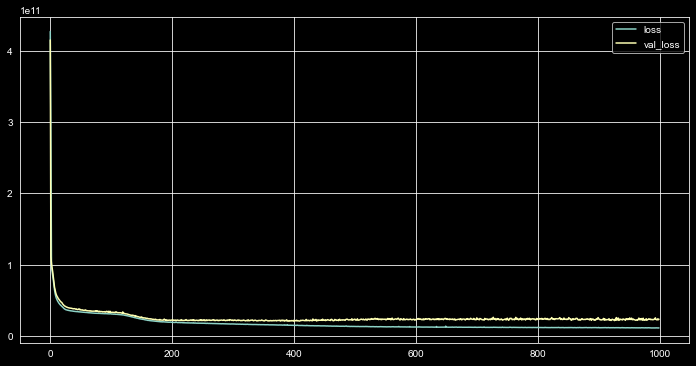

In [81]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [82]:
y_pred = model.predict(X_test)

In [83]:
eval_metric(y_test, y_pred)

r2_score: 0.8942840994412088 
mae: 68427.17605613425 
mse: 13582353736.76441 
rmse: 116543.35560968034


### EarlyStopping

In [84]:
from tensorflow.keras.callbacks import EarlyStopping

In [85]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [86]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)
# 209. de durdu.      val_loss u gözlemle, mode aouto kalsın, vebose işlemci, patience 25 son 25 değerde değişim yok düşmedi.
# patience= 25 : son 25 epochs ta skorda iyileşme olmazsa eğitimi durdur
# callbacks = [early_stop] EARLY STOP İÇİN ÖNEMLİ.
# zaman kazandırı,bekelem ye gerek yok. avantajlı

In [87]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 2ms/step - loss: 427132977152.0000 - val_loss: 411948449792.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 262415466496.0000 - val_loss: 106312663040.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 94681579520.0000 - val_loss: 98217181184.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 86217039872.0000 - val_loss: 89628557312.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 77547864064.0000 - val_loss: 80731004928.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 69046673408.0000 - val_loss: 72291950592.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 61710090240.0000 - val_loss: 65415004160.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 56335409152.0000 - val_loss: 60598128640.0000
Epoch 9/1000
130/130

130/130 [==============================] - 0s 2ms/step - loss: 32268347392.0000 - val_loss: 35138039808.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 32333230080.0000 - val_loss: 35005849600.0000
Epoch 69/1000
130/130 [==============================] - 0s 2ms/step - loss: 32244332544.0000 - val_loss: 34895204352.0000
Epoch 70/1000
130/130 [==============================] - 0s 2ms/step - loss: 32386938880.0000 - val_loss: 35317870592.0000
Epoch 71/1000
130/130 [==============================] - 0s 2ms/step - loss: 32220446720.0000 - val_loss: 34960289792.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 32213858304.0000 - val_loss: 34809888768.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 32124506112.0000 - val_loss: 34752499712.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 32037230592.0000 - val_loss: 34569629696.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 30428848128.0000 - val_loss: 32278626304.0000
Epoch 134/1000
130/130 [==============================] - 0s 1ms/step - loss: 30230888448.0000 - val_loss: 32331302912.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 30189023232.0000 - val_loss: 32293545984.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 30128584704.0000 - val_loss: 32218394624.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 30202038272.0000 - val_loss: 32491235328.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 30101024768.0000 - val_loss: 33034258432.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 30133094400.0000 - val_loss: 32232884224.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 30085351424.0000 - val_loss: 32210309120.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28928499712.0000 - val_loss: 31940093952.0000
Epoch 200/1000
130/130 [==============================] - 0s 2ms/step - loss: 29146449920.0000 - val_loss: 30906384384.0000
Epoch 201/1000
130/130 [==============================] - 0s 2ms/step - loss: 29018499072.0000 - val_loss: 30927837184.0000
Epoch 202/1000
130/130 [==============================] - 0s 2ms/step - loss: 28935630848.0000 - val_loss: 31194482688.0000
Epoch 203/1000
130/130 [==============================] - 0s 3ms/step - loss: 28933705728.0000 - val_loss: 31104440320.0000
Epoch 204/1000
130/130 [==============================] - 0s 2ms/step - loss: 28993103872.0000 - val_loss: 30938630144.0000
Epoch 205/1000
130/130 [==============================] - 0s 2ms/step - loss: 28972634112.0000 - val_loss: 31185403904.0000
Epoch 206/1000
130/130 [==============================] - 0s 1ms/step - loss: 28980019200.0000 - val_loss: 31199385600.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28256462848.0000 - val_loss: 30621077504.0000
Epoch 266/1000
130/130 [==============================] - 0s 1ms/step - loss: 28219109376.0000 - val_loss: 31544172544.0000
Epoch 267/1000
130/130 [==============================] - 0s 1ms/step - loss: 28274927616.0000 - val_loss: 30582011904.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 28186562560.0000 - val_loss: 30428440576.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 28170158080.0000 - val_loss: 30373003264.0000
Epoch 270/1000
130/130 [==============================] - 0s 1ms/step - loss: 28294262784.0000 - val_loss: 30374139904.0000
Epoch 271/1000
130/130 [==============================] - 0s 1ms/step - loss: 28199170048.0000 - val_loss: 31158665216.0000
Epoch 272/1000
130/130 [==============================] - 0s 1ms/step - loss: 28155668480.0000 - val_loss: 30463102976.0000
Epoch 273/1000
130/130 

early_stopping yapmazsak train score düşerken val score sabit kalacağından overfitting'e gider modelimiz

<AxesSubplot:>

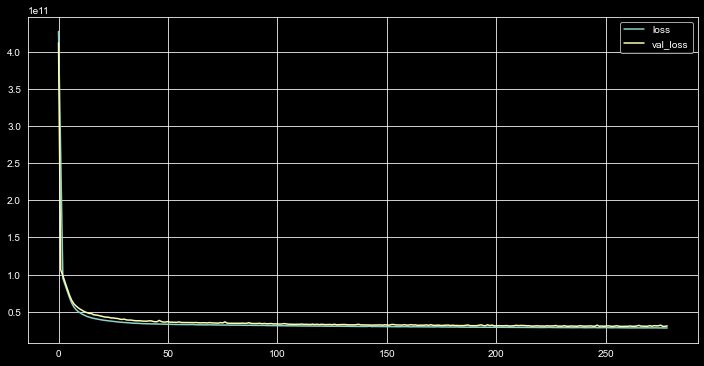

In [88]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [89]:
y_pred = model.predict(X_test)

In [90]:
eval_metric(y_test, y_pred)

r2_score: 0.8099947956272422 
mae: 100362.4796730324 
mse: 24411823424.630547 
rmse: 156242.83479452922


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [91]:
from tensorflow.keras.layers import Dropout

In [92]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1])) # ilk hidden layerdan sonra.
model.add(Dropout(0.2))    # bundan önceki noron sayısının 20 yuzdesini çalıştırma, her defada farklı yuzde 20 yi çalıştırma!
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))    # overfiti engellemek için. Ezberlemesin dedik.
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))    # yuzde elliyi geçmesin iyi olur, 10 yuzde yı kapat dene
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')
# Dropout(0.2) : her seferinde öğrenen nöron sayısını belirlenen oranda (burada %20) azaltarak ve bunu random olarak 
# yaparak modelin ezberlemesini, dolayısıyla overfittinge girmesini engelliyoruz. 

In [93]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [94]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 425008955392.0000 - val_loss: 394468720640.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 209808474112.0000 - val_loss: 104420745216.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 115406749696.0000 - val_loss: 97083211776.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 108714270720.0000 - val_loss: 91642830848.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 102990635008.0000 - val_loss: 84044775424.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 96172507136.0000 - val_loss: 77848264704.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 90306871296.0000 - val_loss: 71407648768.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 83546152960.0000 - val_loss: 69346680832.0000
Epoch 9/1000
130/

130/130 [==============================] - 0s 3ms/step - loss: 55474761728.0000 - val_loss: 35838889984.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 53264232448.0000 - val_loss: 35921612800.0000
Epoch 69/1000
130/130 [==============================] - 0s 3ms/step - loss: 55432695808.0000 - val_loss: 35828097024.0000
Epoch 70/1000
130/130 [==============================] - 0s 3ms/step - loss: 55566979072.0000 - val_loss: 34726858752.0000
Epoch 71/1000
130/130 [==============================] - 0s 2ms/step - loss: 54345777152.0000 - val_loss: 35677093888.0000
Epoch 72/1000
130/130 [==============================] - 0s 3ms/step - loss: 53346074624.0000 - val_loss: 34883112960.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 51733172224.0000 - val_loss: 35553456128.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 54509613056.0000 - val_loss: 34948464640.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 53162856448.0000 - val_loss: 33667827712.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 53471686656.0000 - val_loss: 34837430272.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 52072398848.0000 - val_loss: 33315952640.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 52010950656.0000 - val_loss: 34157568000.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 51836383232.0000 - val_loss: 33623836672.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 51548114944.0000 - val_loss: 33528805376.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 50874548224.0000 - val_loss: 33089587200.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 52492570624.0000 - val_loss: 33820168192.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 52309110784.0000 - val_loss: 32280676352.0000
Epoch 200/1000
130/130 [==============================] - 0s 3ms/step - loss: 51551555584.0000 - val_loss: 32118614016.0000
Epoch 201/1000
130/130 [==============================] - 0s 3ms/step - loss: 51903893504.0000 - val_loss: 33339561984.0000
Epoch 202/1000
130/130 [==============================] - 0s 3ms/step - loss: 51564851200.0000 - val_loss: 32667265024.0000
Epoch 203/1000
130/130 [==============================] - 0s 2ms/step - loss: 50760916992.0000 - val_loss: 31729520640.0000
Epoch 204/1000
130/130 [==============================] - 0s 3ms/step - loss: 52161708032.0000 - val_loss: 32901916672.0000
Epoch 205/1000
130/130 [==============================] - 0s 2ms/step - loss: 50784608256.0000 - val_loss: 31922014208.0000
Epoch 206/1000
130/130 [==============================] - 0s 2ms/step - loss: 51911262208.0000 - val_loss: 34772758528.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 51690434560.0000 - val_loss: 31155195904.0000
Epoch 266/1000
130/130 [==============================] - 0s 3ms/step - loss: 49877733376.0000 - val_loss: 31549143040.0000
Epoch 267/1000
130/130 [==============================] - 0s 3ms/step - loss: 50037968896.0000 - val_loss: 31798353920.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 51808526336.0000 - val_loss: 31227131904.0000
Epoch 269/1000
130/130 [==============================] - 0s 3ms/step - loss: 50139643904.0000 - val_loss: 30830942208.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 49003409408.0000 - val_loss: 31230838784.0000
Epoch 271/1000
130/130 [==============================] - 0s 3ms/step - loss: 50069004288.0000 - val_loss: 30932267008.0000
Epoch 272/1000
130/130 [==============================] - 0s 3ms/step - loss: 50938388480.0000 - val_loss: 31927261184.0000
Epoch 273/1000
130/130 

<AxesSubplot:>

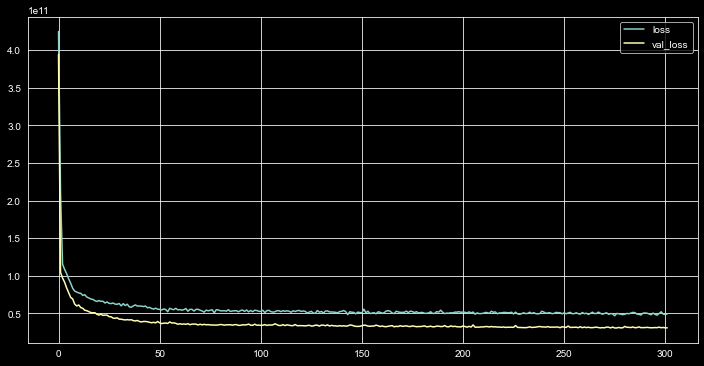

In [95]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [96]:
# değerler düşü, drop out noron sayısını düşürdü, değerler de düştü gerek yok overfite gitmemiş.

In [97]:
y_pred = model.predict(X_test)

In [98]:
eval_metric(y_test, y_pred)

r2_score: 0.8047205100139249 
mae: 100255.52960069444 
mse: 25089462384.618057 
rmse: 158396.53526708865


## Saving Final Model and Scaler

In [99]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))
# en iyi score lar 003 early stop yapmadık overfitting yok,
# scaler pickle
# tüm datayı kullanarak 

In [100]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [101]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000)
# validationu hiç görmediğimiz test setiyle yaptık,
#bu sefer datamı train setim ile eğiteyim ama validation'ı test setleri ile yapayım.
#çünkü tüm data seti ile train edersem validation'ı öğrendiği (modeli fit ettiğim) data ile yapmak zorunda kalırım.
# early sop val datayla ilgilenir.
# Fakat bu final modelde önceki adımdaki modelden farkı, bu sefer train datamda %15 lik validation_split bölümü ayrılmamış.
# yani önceki adıma göre yine fazla bir data ile eğitiyorum !

Epoch 1/1000
152/152 [==============================] - 1s 2ms/step - loss: 416424329216.0000 - val_loss: 332193136640.0000
Epoch 2/1000
152/152 [==============================] - 0s 2ms/step - loss: 144373547008.0000 - val_loss: 89539059712.0000
Epoch 3/1000
152/152 [==============================] - 0s 2ms/step - loss: 91335245824.0000 - val_loss: 81333772288.0000
Epoch 4/1000
152/152 [==============================] - 0s 2ms/step - loss: 83176251392.0000 - val_loss: 73036988416.0000
Epoch 5/1000
152/152 [==============================] - 0s 2ms/step - loss: 74802757632.0000 - val_loss: 64708775936.0000
Epoch 6/1000
152/152 [==============================] - 0s 2ms/step - loss: 66642948096.0000 - val_loss: 57368788992.0000
Epoch 7/1000
152/152 [==============================] - 0s 1ms/step - loss: 60069994496.0000 - val_loss: 52014952448.0000
Epoch 8/1000
152/152 [==============================] - 0s 1ms/step - loss: 55401058304.0000 - val_loss: 48661200896.0000
Epoch 9/1000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 29788069888.0000 - val_loss: 25484085248.0000
Epoch 68/1000
152/152 [==============================] - 0s 2ms/step - loss: 29694418944.0000 - val_loss: 25360379904.0000
Epoch 69/1000
152/152 [==============================] - 0s 1ms/step - loss: 29636280320.0000 - val_loss: 25413152768.0000
Epoch 70/1000
152/152 [==============================] - 0s 1ms/step - loss: 29476419584.0000 - val_loss: 25330538496.0000
Epoch 71/1000
152/152 [==============================] - 0s 2ms/step - loss: 29440798720.0000 - val_loss: 25296472064.0000
Epoch 72/1000
152/152 [==============================] - 0s 1ms/step - loss: 29394151424.0000 - val_loss: 25516625920.0000
Epoch 73/1000
152/152 [==============================] - 0s 2ms/step - loss: 29357002752.0000 - val_loss: 25140533248.0000
Epoch 74/1000
152/152 [==============================] - 0s 2ms/step - loss: 29405933568.0000 - val_loss: 25150142464.0000
Epoch 75/1000
152/152 [=======

152/152 [==============================] - 0s 1ms/step - loss: 27331411968.0000 - val_loss: 23656527872.0000
Epoch 134/1000
152/152 [==============================] - 0s 2ms/step - loss: 27393495040.0000 - val_loss: 23617873920.0000
Epoch 135/1000
152/152 [==============================] - 0s 2ms/step - loss: 27393609728.0000 - val_loss: 23700842496.0000
Epoch 136/1000
152/152 [==============================] - 0s 1ms/step - loss: 27330560000.0000 - val_loss: 23790422016.0000
Epoch 137/1000
152/152 [==============================] - 0s 1ms/step - loss: 27324305408.0000 - val_loss: 23594860544.0000
Epoch 138/1000
152/152 [==============================] - 0s 1ms/step - loss: 27294341120.0000 - val_loss: 23602085888.0000
Epoch 139/1000
152/152 [==============================] - 0s 2ms/step - loss: 27275978752.0000 - val_loss: 23450609664.0000
Epoch 140/1000
152/152 [==============================] - 0s 2ms/step - loss: 27248959488.0000 - val_loss: 23541964800.0000
Epoch 141/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 19246952448.0000 - val_loss: 17209374720.0000
Epoch 200/1000
152/152 [==============================] - 0s 1ms/step - loss: 19209148416.0000 - val_loss: 17263253504.0000
Epoch 201/1000
152/152 [==============================] - 0s 1ms/step - loss: 19240910848.0000 - val_loss: 17105715200.0000
Epoch 202/1000
152/152 [==============================] - 0s 2ms/step - loss: 19086342144.0000 - val_loss: 16964744192.0000
Epoch 203/1000
152/152 [==============================] - 0s 2ms/step - loss: 18976591872.0000 - val_loss: 16893683712.0000
Epoch 204/1000
152/152 [==============================] - 0s 3ms/step - loss: 18969956352.0000 - val_loss: 16906132480.0000
Epoch 205/1000
152/152 [==============================] - 0s 2ms/step - loss: 18906306560.0000 - val_loss: 16789634048.0000
Epoch 206/1000
152/152 [==============================] - 0s 2ms/step - loss: 18915543040.0000 - val_loss: 16901697536.0000
Epoch 207/1000
152/152 

Epoch 265/1000
152/152 [==============================] - 0s 2ms/step - loss: 16513788928.0000 - val_loss: 15223120896.0000
Epoch 266/1000
152/152 [==============================] - 0s 2ms/step - loss: 16336475136.0000 - val_loss: 15519698944.0000
Epoch 267/1000
152/152 [==============================] - 0s 2ms/step - loss: 16355451904.0000 - val_loss: 15987374080.0000
Epoch 268/1000
152/152 [==============================] - 0s 2ms/step - loss: 16399269888.0000 - val_loss: 15245436928.0000
Epoch 269/1000
152/152 [==============================] - 0s 1ms/step - loss: 16262800384.0000 - val_loss: 15547330560.0000
Epoch 270/1000
152/152 [==============================] - 0s 2ms/step - loss: 16306207744.0000 - val_loss: 15366139904.0000
Epoch 271/1000
152/152 [==============================] - 0s 2ms/step - loss: 16219329536.0000 - val_loss: 15528664064.0000
Epoch 272/1000
152/152 [==============================] - 0s 2ms/step - loss: 16189160448.0000 - val_loss: 15241352192.0000
Epoch 27

152/152 [==============================] - 0s 1ms/step - loss: 14541074432.0000 - val_loss: 14806694912.0000
Epoch 332/1000
152/152 [==============================] - 0s 1ms/step - loss: 14486121472.0000 - val_loss: 14485553152.0000
Epoch 333/1000
152/152 [==============================] - 0s 1ms/step - loss: 14438380544.0000 - val_loss: 14903826432.0000
Epoch 334/1000
152/152 [==============================] - 0s 2ms/step - loss: 14567108608.0000 - val_loss: 15258707968.0000
Epoch 335/1000
152/152 [==============================] - 0s 1ms/step - loss: 14433950720.0000 - val_loss: 14751864832.0000
Epoch 336/1000
152/152 [==============================] - 0s 1ms/step - loss: 14343018496.0000 - val_loss: 15145334784.0000
Epoch 337/1000
152/152 [==============================] - 0s 1ms/step - loss: 14451078144.0000 - val_loss: 14988635136.0000
Epoch 338/1000
152/152 [==============================] - 0s 1ms/step - loss: 14487166976.0000 - val_loss: 14708416512.0000
Epoch 339/1000
152/152 

152/152 [==============================] - 0s 1ms/step - loss: 13765493760.0000 - val_loss: 14285592576.0000
Epoch 398/1000
152/152 [==============================] - 0s 2ms/step - loss: 13468830720.0000 - val_loss: 14202858496.0000
Epoch 399/1000
152/152 [==============================] - 0s 2ms/step - loss: 13601822720.0000 - val_loss: 14064947200.0000
Epoch 400/1000
152/152 [==============================] - 0s 2ms/step - loss: 13456630784.0000 - val_loss: 14023405568.0000
Epoch 401/1000
152/152 [==============================] - 0s 2ms/step - loss: 13533456384.0000 - val_loss: 14145000448.0000
Epoch 402/1000
152/152 [==============================] - 0s 1ms/step - loss: 13518950400.0000 - val_loss: 13985844224.0000
Epoch 403/1000
152/152 [==============================] - 0s 2ms/step - loss: 13428342784.0000 - val_loss: 13937421312.0000
Epoch 404/1000
152/152 [==============================] - 0s 1ms/step - loss: 13347685376.0000 - val_loss: 14124873728.0000
Epoch 405/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 12995187712.0000 - val_loss: 14269650944.0000
Epoch 464/1000
152/152 [==============================] - 0s 1ms/step - loss: 13052895232.0000 - val_loss: 13657163776.0000
Epoch 465/1000
152/152 [==============================] - 0s 1ms/step - loss: 13005896704.0000 - val_loss: 14003043328.0000
Epoch 466/1000
152/152 [==============================] - 0s 2ms/step - loss: 13007930368.0000 - val_loss: 13589979136.0000
Epoch 467/1000
152/152 [==============================] - 0s 1ms/step - loss: 13036514304.0000 - val_loss: 14011995136.0000
Epoch 468/1000
152/152 [==============================] - 0s 1ms/step - loss: 13033366528.0000 - val_loss: 13439579136.0000
Epoch 469/1000
152/152 [==============================] - 0s 2ms/step - loss: 13017467904.0000 - val_loss: 13667917824.0000
Epoch 470/1000
152/152 [==============================] - 0s 2ms/step - loss: 13029164032.0000 - val_loss: 13642339328.0000
Epoch 471/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 12835976192.0000 - val_loss: 13844770816.0000
Epoch 530/1000
152/152 [==============================] - 0s 2ms/step - loss: 12759650304.0000 - val_loss: 13954179072.0000
Epoch 531/1000
152/152 [==============================] - 0s 2ms/step - loss: 12940260352.0000 - val_loss: 13922311168.0000
Epoch 532/1000
152/152 [==============================] - 0s 2ms/step - loss: 12656393216.0000 - val_loss: 13413301248.0000
Epoch 533/1000
152/152 [==============================] - 0s 2ms/step - loss: 12699784192.0000 - val_loss: 13231456256.0000
Epoch 534/1000
152/152 [==============================] - 0s 2ms/step - loss: 12970265600.0000 - val_loss: 13538229248.0000
Epoch 535/1000
152/152 [==============================] - 0s 2ms/step - loss: 12756293632.0000 - val_loss: 13316835328.0000
Epoch 536/1000
152/152 [==============================] - 0s 2ms/step - loss: 12800698368.0000 - val_loss: 13419613184.0000
Epoch 537/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 12495873024.0000 - val_loss: 13897601024.0000
Epoch 596/1000
152/152 [==============================] - 0s 1ms/step - loss: 12612424704.0000 - val_loss: 13623209984.0000
Epoch 597/1000
152/152 [==============================] - 0s 2ms/step - loss: 12516654080.0000 - val_loss: 13979362304.0000
Epoch 598/1000
152/152 [==============================] - 0s 1ms/step - loss: 12609302528.0000 - val_loss: 13788559360.0000
Epoch 599/1000
152/152 [==============================] - 0s 1ms/step - loss: 12526053376.0000 - val_loss: 13474632704.0000
Epoch 600/1000
152/152 [==============================] - 0s 1ms/step - loss: 12529191936.0000 - val_loss: 13764717568.0000
Epoch 601/1000
152/152 [==============================] - 0s 1ms/step - loss: 12592456704.0000 - val_loss: 13269841920.0000
Epoch 602/1000
152/152 [==============================] - 0s 2ms/step - loss: 12530064384.0000 - val_loss: 13706303488.0000
Epoch 603/1000
152/152 

Epoch 661/1000
152/152 [==============================] - 0s 2ms/step - loss: 12402079744.0000 - val_loss: 13785687040.0000
Epoch 662/1000
152/152 [==============================] - 0s 1ms/step - loss: 12408606720.0000 - val_loss: 13951564800.0000
Epoch 663/1000
152/152 [==============================] - 0s 1ms/step - loss: 12424834048.0000 - val_loss: 13728506880.0000
Epoch 664/1000
152/152 [==============================] - 0s 2ms/step - loss: 12405854208.0000 - val_loss: 13576690688.0000
Epoch 665/1000
152/152 [==============================] - 0s 2ms/step - loss: 12405761024.0000 - val_loss: 13525771264.0000
Epoch 666/1000
152/152 [==============================] - 0s 2ms/step - loss: 12514809856.0000 - val_loss: 13935713280.0000
Epoch 667/1000
152/152 [==============================] - 0s 2ms/step - loss: 12363763712.0000 - val_loss: 13685105664.0000
Epoch 668/1000
152/152 [==============================] - 0s 2ms/step - loss: 12373569536.0000 - val_loss: 13921964032.0000
Epoch 66

152/152 [==============================] - 0s 2ms/step - loss: 12181054464.0000 - val_loss: 13918867456.0000
Epoch 728/1000
152/152 [==============================] - 0s 2ms/step - loss: 12347851776.0000 - val_loss: 13812724736.0000
Epoch 729/1000
152/152 [==============================] - 0s 2ms/step - loss: 12281932800.0000 - val_loss: 13632866304.0000
Epoch 730/1000
152/152 [==============================] - 0s 2ms/step - loss: 12234502144.0000 - val_loss: 13916004352.0000
Epoch 731/1000
152/152 [==============================] - 0s 2ms/step - loss: 12348790784.0000 - val_loss: 13622753280.0000
Epoch 732/1000
152/152 [==============================] - 0s 2ms/step - loss: 12509229056.0000 - val_loss: 14676362240.0000
Epoch 733/1000
152/152 [==============================] - 0s 2ms/step - loss: 12291744768.0000 - val_loss: 14131399680.0000
Epoch 734/1000
152/152 [==============================] - 0s 2ms/step - loss: 12315990016.0000 - val_loss: 13825809408.0000
Epoch 735/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 12256764928.0000 - val_loss: 13681978368.0000
Epoch 794/1000
152/152 [==============================] - 0s 2ms/step - loss: 12155037696.0000 - val_loss: 13602415616.0000
Epoch 795/1000
152/152 [==============================] - 0s 1ms/step - loss: 12128152576.0000 - val_loss: 14115241984.0000
Epoch 796/1000
152/152 [==============================] - 0s 2ms/step - loss: 12162388992.0000 - val_loss: 13717987328.0000
Epoch 797/1000
152/152 [==============================] - 0s 1ms/step - loss: 12206856192.0000 - val_loss: 13709271040.0000
Epoch 798/1000
152/152 [==============================] - 0s 2ms/step - loss: 12168950784.0000 - val_loss: 14489044992.0000
Epoch 799/1000
152/152 [==============================] - 0s 2ms/step - loss: 12192371712.0000 - val_loss: 13888473088.0000
Epoch 800/1000
152/152 [==============================] - 0s 1ms/step - loss: 12179849216.0000 - val_loss: 14204658688.0000
Epoch 801/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 12184169472.0000 - val_loss: 13238918144.0000
Epoch 860/1000
152/152 [==============================] - 0s 2ms/step - loss: 12026317824.0000 - val_loss: 13809580032.0000
Epoch 861/1000
152/152 [==============================] - 0s 2ms/step - loss: 12063293440.0000 - val_loss: 13203850240.0000
Epoch 862/1000
152/152 [==============================] - 1s 4ms/step - loss: 12020370432.0000 - val_loss: 13536379904.0000
Epoch 863/1000
152/152 [==============================] - 1s 4ms/step - loss: 12078526464.0000 - val_loss: 13419941888.0000
Epoch 864/1000
152/152 [==============================] - 1s 4ms/step - loss: 12061936640.0000 - val_loss: 13302782976.0000
Epoch 865/1000
152/152 [==============================] - 0s 3ms/step - loss: 11933195264.0000 - val_loss: 13818066944.0000
Epoch 866/1000
152/152 [==============================] - 0s 2ms/step - loss: 11883055104.0000 - val_loss: 13420230656.0000
Epoch 867/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 11863852032.0000 - val_loss: 13066146816.0000
Epoch 926/1000
152/152 [==============================] - 0s 2ms/step - loss: 11788597248.0000 - val_loss: 12986856448.0000
Epoch 927/1000
152/152 [==============================] - 0s 2ms/step - loss: 11687616512.0000 - val_loss: 13412087808.0000
Epoch 928/1000
152/152 [==============================] - 0s 1ms/step - loss: 11914448896.0000 - val_loss: 13190739968.0000
Epoch 929/1000
152/152 [==============================] - 0s 1ms/step - loss: 11820531712.0000 - val_loss: 13159003136.0000
Epoch 930/1000
152/152 [==============================] - 0s 1ms/step - loss: 11763361792.0000 - val_loss: 13142607872.0000
Epoch 931/1000
152/152 [==============================] - 0s 1ms/step - loss: 11681379328.0000 - val_loss: 12857142272.0000
Epoch 932/1000
152/152 [==============================] - 0s 1ms/step - loss: 11916845056.0000 - val_loss: 13155706880.0000
Epoch 933/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 11633361920.0000 - val_loss: 13179634688.0000
Epoch 992/1000
152/152 [==============================] - 0s 2ms/step - loss: 11675103232.0000 - val_loss: 13545277440.0000
Epoch 993/1000
152/152 [==============================] - 0s 2ms/step - loss: 11802848256.0000 - val_loss: 13112122368.0000
Epoch 994/1000
152/152 [==============================] - 0s 1ms/step - loss: 11566935040.0000 - val_loss: 13335150592.0000
Epoch 995/1000
152/152 [==============================] - 0s 1ms/step - loss: 11585319936.0000 - val_loss: 13257787392.0000
Epoch 996/1000
152/152 [==============================] - 0s 1ms/step - loss: 11583865856.0000 - val_loss: 13295797248.0000
Epoch 997/1000
152/152 [==============================] - 0s 1ms/step - loss: 11686963200.0000 - val_loss: 13209874432.0000
Epoch 998/1000
152/152 [==============================] - 0s 2ms/step - loss: 11663955968.0000 - val_loss: 12770477056.0000
Epoch 999/1000
152/152 

 los değeri düşerken val_score yukselme eğilimde ? overfite gidiyor, demek

<AxesSubplot:>

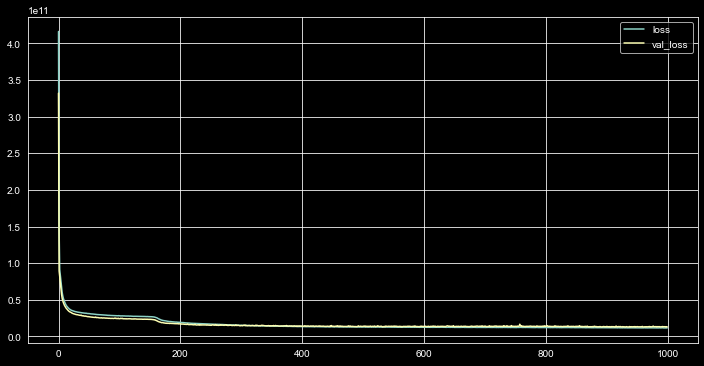

In [102]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [103]:
y_pred = model.predict(X_test)

In [104]:
eval_metric(y_test, y_pred)

r2_score: 0.8984046780815921 
mae: 70251.8611400463 
mse: 13052942774.004673 
rmse: 114249.4760338299


In [105]:
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'
# weight ve parametereleri saklaması için

## Loading Model and Scaler

In [106]:
from tensorflow.keras.models import load_model  # load model  ile

In [107]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb")) # pickle  ile

## Prediction

In [108]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,new_age
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0,66.000


In [109]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.57149751, 0.21760797, 0.15304348, 0.00573322,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 1.        ,
        0.        , 0.        , 0.52173913]])

In [110]:
model_kc_house.predict(single_house)  # tahmin değeri

array([[246109.06]], dtype=float32)

In [111]:
df.iloc[0][0]     # gerçek değer.

221900.0

## Comparison with ML

### Linear Regression

In [112]:
from sklearn.linear_model import LinearRegression 

In [113]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)
# linear reg. göre 13000 iterasyon yaparak 20 puan artırdık.

r2_score: 0.7056349831350651 
mae: 124814.02407407407 
mse: 37819947289.43056 
rmse: 194473.51307936656


### Random Forest

In [114]:
from sklearn.ensemble import RandomForestRegressor

In [115]:
rf_model = RandomForestRegressor(random_state = 101)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8919043304237275 
mae: 64241.461726851856 
mse: 13888105893.59579 
rmse: 117847.80818324875


In [116]:
MLOPS
Matt-Instructor  10:34 PM
Airflow, luigi gibi toollar kullanılabilir
New
Orion C.-Instructor  10:34 PM
DEVOPS  un data science versiyonu
C8316-Suleyman  10:34 PM

SyntaxError: invalid syntax (<ipython-input-116-9459358bd4c1>, line 2)